# Motivation Notebook


In this notebook various examples of audio data augmentation techniques are described in relation with physical world and/or approaches existing in other domains. This notebook also illustrates various views of audio data and problems associated with audio recordings.


In [1]:
import sys
import os
sys.path.append(os.path.abspath("py/"))

from augmenters import *
from helpers import *
from setup import *

names = ['Original Recording Example.mp3',
         'Hall Recording Example.mp3', 'Street Recording Example.mp3']

path_pref = '../Examples/'

add_audio = True # This variable determines whether or not to add the audio as a Jupyter widget

## Real World Examples


To illustrate some specifics of this domain, [artificial recording](../Examples/Original%20Recording%20Example.mp3) was created. It is purely digital, free of environmental/acoustic changes. It was then played back in a real environment, such as [university hall](../Examples/Hall%20Recording%20Example.mp3) and [street](../Examples/Street%20Recording%20Example.mp3) in order to illustrate some of the changes that can affect the target sound (the one that has to be analyzed) while recording.
Below, the two most common views of audio data are described. These views are then used to illustrate differences between artificial recording and its real-world copies.

**First** comes the original artificial recording. It was created using digital tools and has never gone through a playback-record cycle, meaning that a microphone did not record it, but it was synthetically generated, keeping it free from various recording defects and environmental noises. We usually use either a waveform view or a spectrogram to describe such data. Waveform view is an amplitude/time visualization similar to views known in time series analysis. It is generally effective yet is insufficient to describe an audio signal adequately. Alternative to it is a spectrogram view, where time remains an x-axis, while amplitude becomes a color bar and frequency component becomes the y-axis. This view allows us to describe an audio recording with the change of frequency component over time.

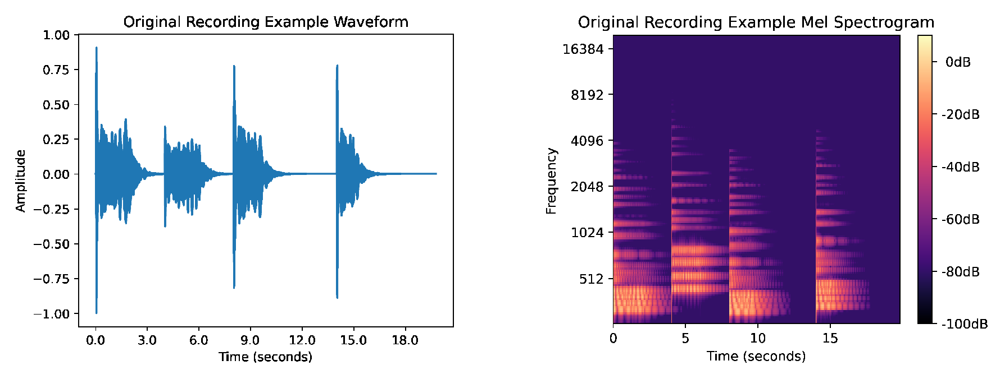

In [2]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
plot_sample(y, sr, include_audio=add_audio,label=file_name.split('.')[0])

**The second** recording was taken in a university hall. While the recording has a hearable echo, the waveform view hardly tells anything about it. The spectrogram view is slightly more informative. We can see that everything has become a bit smoother along the x-axis compared to an original sound spectrogram.


In addition to this "smoothing" effect, hall recording also exhibits some noise and digital clipping that must've come from the recording device itself.

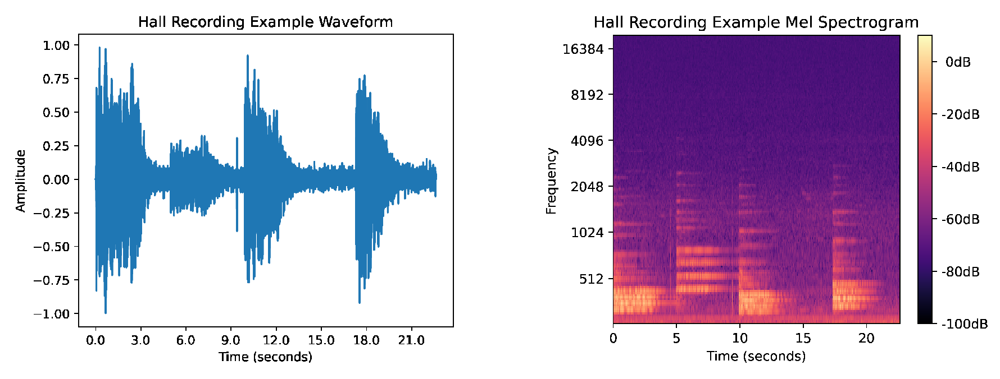

In [3]:
file_name = names[1]
y = load_audio(path_pref + file_name, sr=sr)
plot_sample(y, sr, include_audio=add_audio, label=file_name.split('.')[0])

**The third** recording is somewhat similar to the second one, yet it was recorded on the street, exposing the recording device to different kinds of noise. This one is also free from the strange clipping effect seen on a previous one, but the noise is much more noticeable.

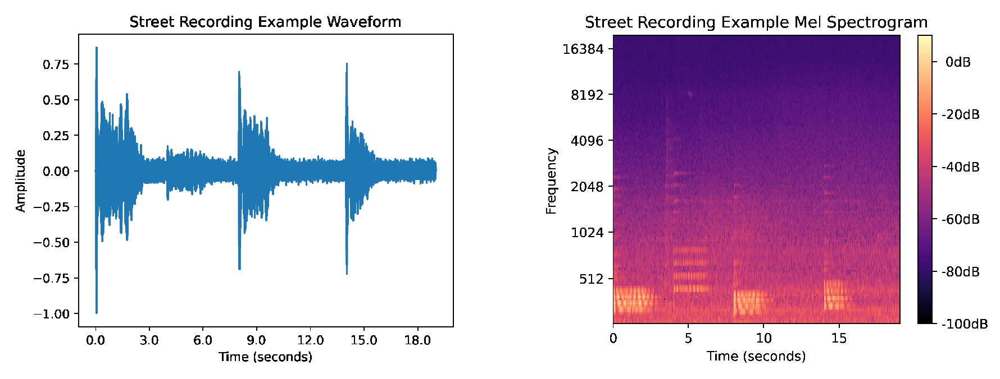

In [4]:
file_name = names[2]
y = load_audio(path_pref + file_name, sr=sr)
plot_sample(y, sr, include_audio=add_audio, label=file_name.split('.')[0])

These sounds perfectly illustrate what "deformations" sound recordings go through in the natural environment. A model applied to real-world data is likely to be exposed to these and further degenerative effects.


Such a model’s primary goal is to distinguish the target sound from the environment and then drive certain conclusions from it. Various data augmentation techniques can help to achieve this goal.


Although it is not the main topic of this paper, a brief note should be made about the parameters of various spectrogram settings.

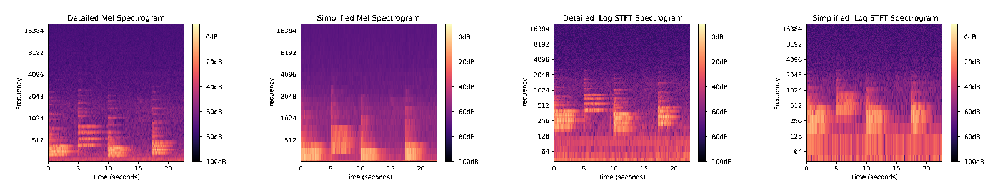

In [5]:
fig, axs = plt.subplots(1, 4, figsize=(8, 4), dpi=250)
file_name = names[1]
y = load_audio(path_pref + file_name, sr=sr)

axs[0].axis('off')
axs[0].imshow(build_spec(y, sr, mode="mel", num_filters=186, db=(-100, 10),
              flim=(20, 20000), label="Detailed"), interpolation='nearest')
axs[1].axis('off')
axs[1].imshow(build_spec(y, sr, mode="mel", num_filters=32, db=(-100, 10),
              flim=(20, 20000), label="Simplified"), interpolation='nearest')
axs[2].axis('off')
axs[2].imshow(build_spec(y, sr, mode="log", num_filters=2056, db=(-100, 10),
              flim=(20, 20000), label=" Detailed "), interpolation='nearest')
axs[3].axis('off')
axs[3].imshow(build_spec(y, sr, mode="log", num_filters=512, db=(-100, 10),
              flim=(20, 20000), label=" Simplified "), interpolation='nearest')
plt.show()

Basically, there are two most common ways we generate spectrograms:


1. Standard STFT (Short-time Fourier transform) Spectrogram - The original signal is decomposed into Fourier series, and its coefficients are then used to determine the power of each frequency component. The most basic form uses linear y-scale, but log y-scale is more prevalent in existing studies and definitely allows for more information to appear within the hearable (20Hz - 20 000Hz)domain.

2. Mel Spectrogram - is a slightly altered version. coefficients are obtained using an improved approach, and the y-axis is not linear nor log one but is a mel-scale based on a human ear perception survey.

Both types of spectrograms are useful, but for our purpose, the Mel spectrogram is more beneficial as it does not show any notable issues within the lower frequency range and works better with noise. Also, in the current realization, it takes less time to get a mel spectrogram compared to the STFT one. This is going to play a considerable role when batch-processing a bigger dataset.

Note that in both cases, the "precision" of the view is determined through a number of components/filters. Decomposition of an input into the Fourier series with n components is going to be less precise (therefore, less informative) than similar decomposition with, for example, 2\*n components. The practical limitation here is that spectrograms are rendered into images of a fixed size (224x224 pixels). It is, therefore, not beneficial to spend additional time on the generation of highly precise spectrograms that are then going to be represented in low-resolution images.

# Data Augmentation Techniques


Considering the problems mentioned above, the main goal of data augmentation techniques applicable to audio data should be to enlarge a dataset to help a model trained on it perform better. For instance, in the remote-sensing domain, a helpful technique would be a rotation of an image if its contents can indeed be recorded with an angle. Alternatively, the addition of noise to an original sample can prove to be meaningful if actual data is also likely to be exposed to some kind of noise.

The main contribution of this work is that augmentation approaches need to be studied better. We compare a few approaches described in the existing literature and propose additional ones. All considering the specificity of audio data.

## 1. Heavy Distortion

As described in the literature, heavy distortion of a recording turned out to be an effective data augmentation technique. In the original paper (see thesis for proper citation), "Heavy Distortion" is described as a combination of sample rate and bit rate reduction, as well as the addition of noise and clipping of the sound. The software providing this effect is still freely available but hard to reuse. Instead, we recreate a similar effect using the Pedalboard Python package, designed and maintained by the Spotify team. An example can be seen below.

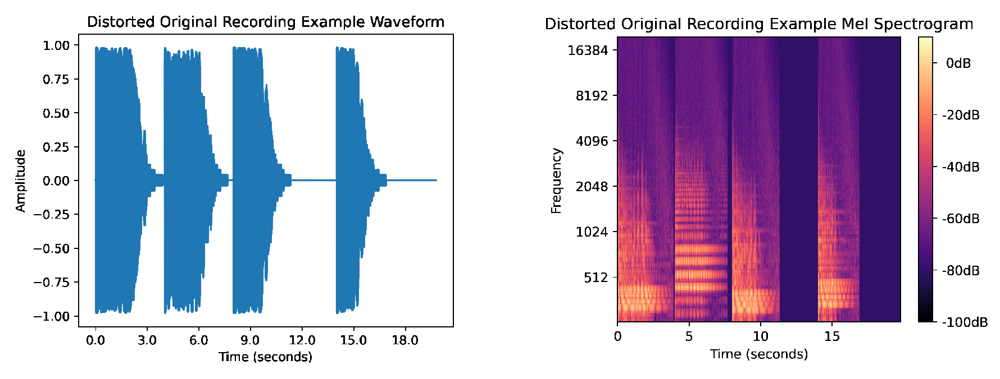

In [6]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y = bitcrusher_effect(y, sr)
efn = "Distorted "
plot_sample(y, sr, include_audio=add_audio,
            label=efn + file_name.split('.')[0])
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y, sr)

## 2. Delay

Delay is a technique proposed in this work. It is a widespread audio effect that is common in natural environments. The alternative name is echo.
Practically speaking, it is an effect resulting in a copy of the original signal, delayed in time, to be mixed with the original sound.
In physics, this is caused mainly by the reflection of sound waves from the walls of a room. This effect is proposed to be used as an augmentation technique, as it primarily affects signal alongside the time axis, possibly allowing models to distinguish similar events happening in slightly different time points.

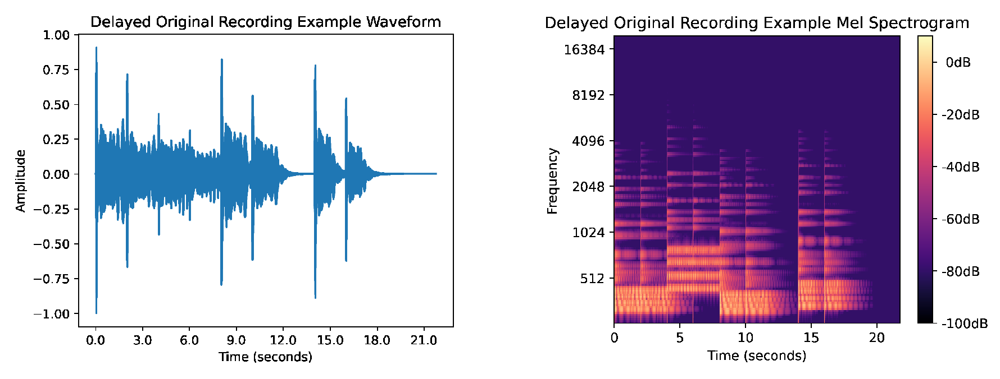

In [7]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y = simple_delay(y, sr, delay_time=0.1, trim=False)
efn = "Delayed "
plot_sample(y, sr, include_audio=add_audio,
            label=efn + file_name.split('.')[0])
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y, sr)

## 3a. Audio MixUp

MixUp is a common technique used in computer vision. Two images are mixed together with a particular parameter alpha (take the alpha % of the first image and (1-alpha) % of the other one). Images can be from different classes of the same one. The class label of the retrieved image is normally a mix of original labels.

The method itself proved to be helpful. However, it has a few drawbacks when applied to the audio data. Some studies proposed to mix spectrogram images, yet there is a significant problem regarding axis scaling here. If we were to consider two audio recordings of different lengths, and this is the case with the dataset used further in this study, their time-axis on the spectrogram would not be the same, resulting in some surreal mix of images. The same could happen to frequency and power axes.

Instead, we propose to combine signals at their audio view. We add two scaled vectors, taking the output length as the length of a longer recording and zero-padding the shorter one. As a result, we retrieve a recording that fits the physical meaning of 2 sounds being mixed, and not some abstract image mixing.

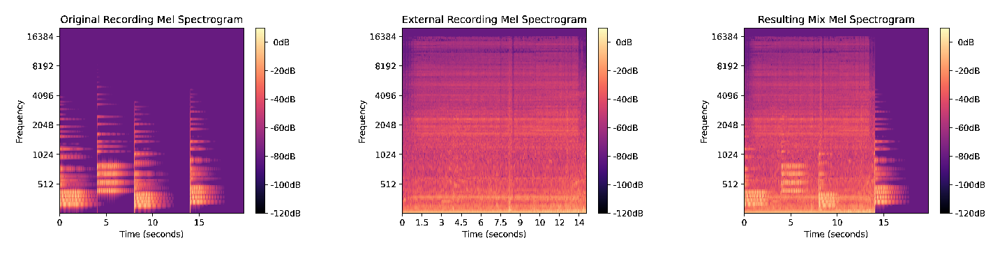

In [8]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y_ext = load_audio(path_pref + "New Recording.mp3", sr=sr)
y_n, _ = audio_mixup(y, y_ext, 1, 2, alpha=0.7)

im1 = build_spec(y, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label='Original Recording')

im2 = build_spec(y_ext, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label='External Recording')

ime = build_spec(y_n, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label='Resulting Mix')

efn = "AMixUp "
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y_n, sr)
fig, axs = plt.subplots(1, 3, figsize=(8, 6), dpi=224)
axs[0].axis('off')
axs[0].imshow(im1, interpolation='nearest')
#axs[0].title.set_text('Original')
axs[1].axis('off')
axs[1].imshow(im2, interpolation='nearest')
#axs[1].title.set_text('External sound')
axs[2].axis('off')
axs[2].imshow(ime, interpolation='nearest')
#axs[2].title.set_text('Result')
plt.show()

## 3b. Image MixUp


In contrary to 3a, 3b is the original image mixing technique, note the considerable difference in the result.


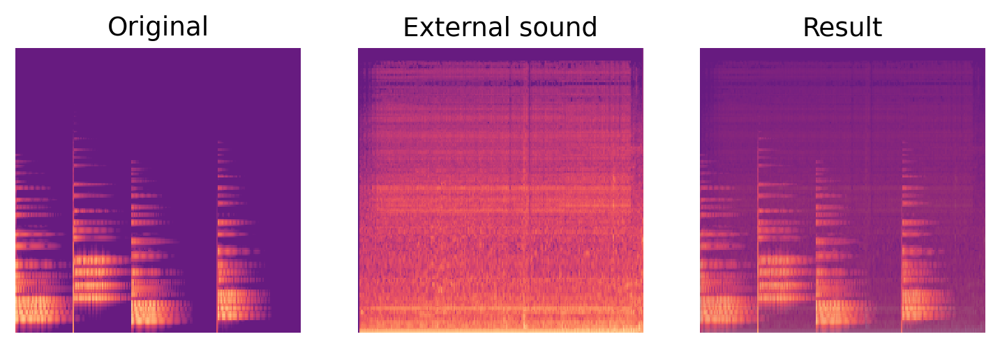

True

In [9]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
im1 = build_spec(y, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label=None)

y_ext = load_audio(path_pref + "New Recording.mp3", sr=sr)
im2 = build_spec(y_ext, sr, mode="mel", num_filters=186,
                 db=udb, flim=uflim, label=None)
ime = img_mixup(im1, im2, alpha=0.66)
fig, axs = plt.subplots(1, 3, figsize=(8, 6), dpi=224)
axs[0].axis('off')
axs[0].imshow(im1, interpolation='nearest')
axs[0].title.set_text('Original')
axs[1].axis('off')
axs[1].imshow(im2, interpolation='nearest')
axs[1].title.set_text('External sound')
axs[2].axis('off')
axs[2].imshow(ime, interpolation='nearest')
axs[2].title.set_text('Result')
plt.show()

cv2.imwrite(plot_directory+"MixUp_example.png", ime)

## 4. Image Warping

One of the related works suggested image warping as a relevant augmentation technique. This technique is usually applied in other domains of computer vision, but the method itself can only be applied to spectrograms and has little to no meaning in audio. Basically, Image warping produces a copy of an input image, where shapes are linearly deformed. So-called warping points set deformation rules. In our case, these are randomly generated with specific constraints to produce not-so-strong deformations. As a result, we achieve deformation alongside both x- and y- axes. There is little to no change in color, though.

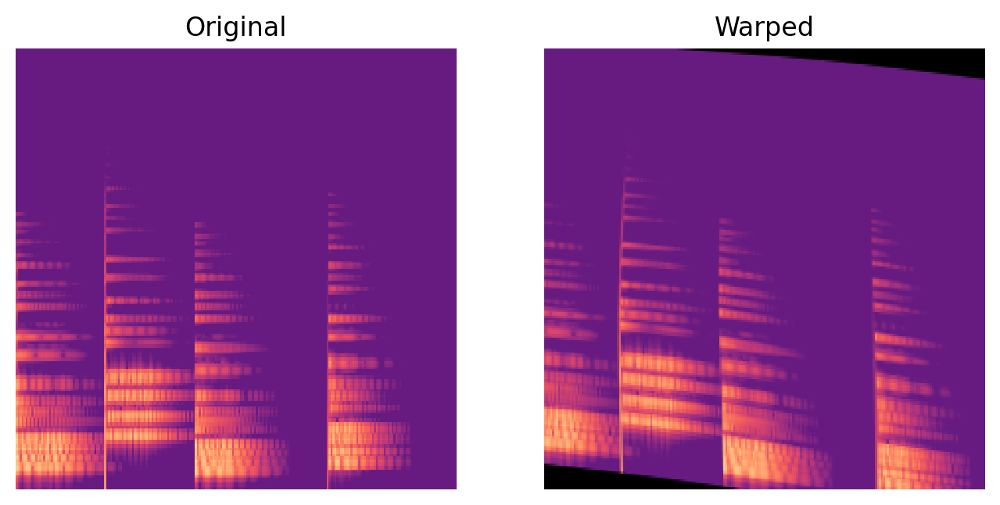

True

In [10]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
im = build_spec(y, sr, mode="mel", num_filters=186,
                db=udb, flim=uflim, label=None)
new_im = warp_img(im, strength=0.05)
fig, axs = plt.subplots(1, 2, figsize=(8, 6), dpi=200)
axs[0].axis('off')
axs[0].imshow(im, interpolation='nearest')
axs[0].title.set_text('Original')
axs[1].axis('off')
axs[1].imshow(new_im, interpolation='nearest')
axs[1].title.set_text('Warped')
plt.show()
cv2.imwrite(plot_directory+"Warped_example.png", new_im)

## 5. Room Simulation

As most of the augmentation techniques described in this work mimic "deformations" caused by the real environment, it is also an option to play a recording through a virtual room, which can cause various echoes and noises to add to the original recording.

For this purpose, a Python package called pyroomacoustics is used. It allows the creating of a room of any form, with any kind of walls and obstacles. It can even enable researchers to set up an array of microphones and sound sources. Deciding on the exact setup can be tricky and should probably depend on the final task in mind, but a basic room should be enough to illustrate the effect for our purpose. Detailed setting is provided in augmenters.py. Note that the resulting sound has some reverberation, noise, and delay - deformations slightly similar to those mentioned previously (hear [university hall](../Examples/Hall%20Recording%20Example.mp3) as an example). The main drawback of this approach is speed. Computing this effect is comparatively costly.

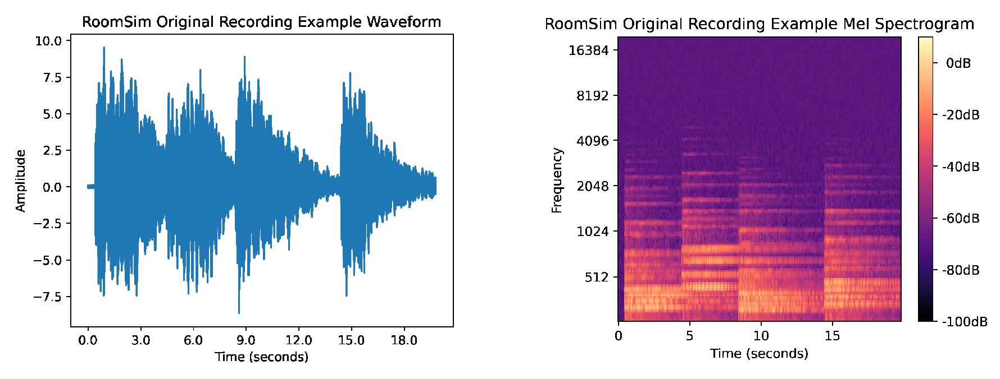

In [11]:
file_name = names[0]
y = load_audio(path_pref + file_name, sr=sr)
y = simulate_room(y, sr=sr, room_dim=[10, 20, 10], rt=1.5)

efn = "RoomSim "
plot_sample(y, sr, include_audio=add_audio,
            label=efn + file_name.split('.')[0])
save_audio(path_pref + efn + file_name.split('.')[0] + ".wav",y, sr)